In [1]:
import numpy as np
import pandas as pd
#visualizations
import plotly.express as px
import plotly.graph_objects as go  # for 3D plot visualization
import plotly.figure_factory as ff
from plotly.offline import init_notebook_mode, iplot
import matplotlib.pyplot as plt
import seaborn as sns
init_notebook_mode(connected=True)
#EDA
import re
from sklearn.utils import resample


In [2]:
test = pd.read_csv('/kaggle/input/playground-series-s4e9/test.csv')
train = pd.read_csv('/kaggle/input/playground-series-s4e9/train.csv')

In [3]:
test.shape

(125690, 12)

In [4]:
print("train shape: ", train.shape)
train.head()

train shape:  (188533, 13)


,id,brand,model,model_year,milage,fuel_type,engine,transmission,ext_col,int_col,accident,clean_title,price
0,0,MINI,Cooper S Base,2007,213000,Gasoline,172.0HP 1.6L 4 Cylinder Engine Gasoline Fuel,A/T,Yellow,Gray,None reported,Yes,4200
1,1,Lincoln,LS V8,2002,143250,Gasoline,252.0HP 3.9L 8 Cylinder Engine Gasoline Fuel,A/T,Silver,Beige,At least 1 accident or damage reported,Yes,4999
2,2,Chevrolet,Silverado 2500 LT,2002,136731,E85 Flex Fuel,320.0HP 5.3L 8 Cylinder Engine Flex Fuel Capab...,A/T,Blue,Gray,None reported,Yes,13900
3,3,Genesis,G90 5.0 Ultimate,2017,19500,Gasoline,420.0HP 5.0L 8 Cylinder Engine Gasoline Fuel,Transmission w/Dual Shift Mode,Black,Black,None reported,Yes,45000
4,4,Mercedes-Benz,Metris Base,2021,7388,Gasoline,208.0HP 2.0L 4 Cylinder Engine Gasoline Fuel,7-Speed A/T,Black,Beige,None reported,Yes,97500


In [5]:
print('The int_col:',train['int_col'].nunique())
print('The ext_col:',train['ext_col'].nunique())
print('The model:', train['model'].nunique())
print('The brand:',train['brand'].nunique())
print('The fuel_type:',train['fuel_type'].nunique())
print('The engine:',train['engine'].nunique())
print('The accident:',train['accident'].nunique())
print('The transmission:',train['transmission'].nunique())

The int_col: 156
The ext_col: 319
The model: 1897
The brand: 57
The fuel_type: 7
The engine: 1117
The accident: 2
The transmission: 52


In [6]:
train.isnull().sum()

id                  0
brand               0
model               0
model_year          0
milage              0
fuel_type        5083
engine              0
transmission        0
ext_col             0
int_col             0
accident         2452
clean_title     21419
price               0
dtype: int64

In [7]:
train.drop('clean_title' , axis = 1, inplace = True)
train.dropna(inplace = True)
train.shape
train.isnull().sum()

id              0
brand           0
model           0
model_year      0
milage          0
fuel_type       0
engine          0
transmission    0
ext_col         0
int_col         0
accident        0
price           0
dtype: int64

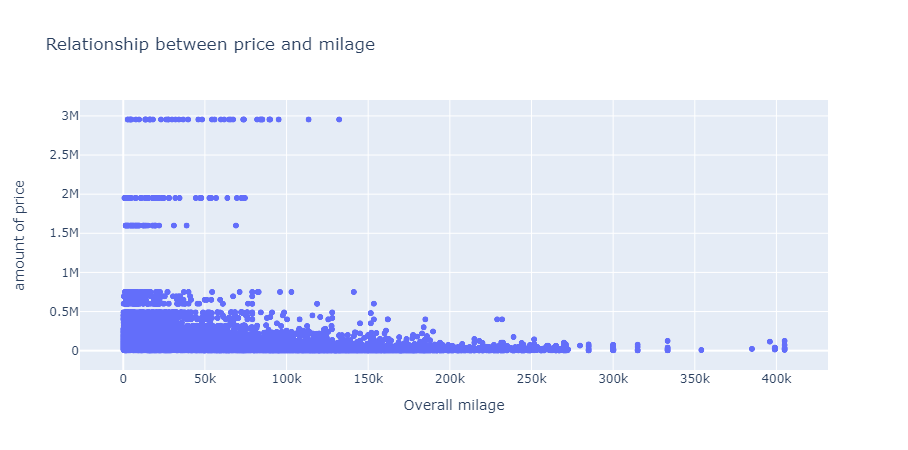

In [8]:
fig = px.scatter(train, x='milage', y='price', 
                 labels={'milage':'Overall milage', 'price':'amount of price'}, 
                 title='Relationship between price and milage')

fig.show()

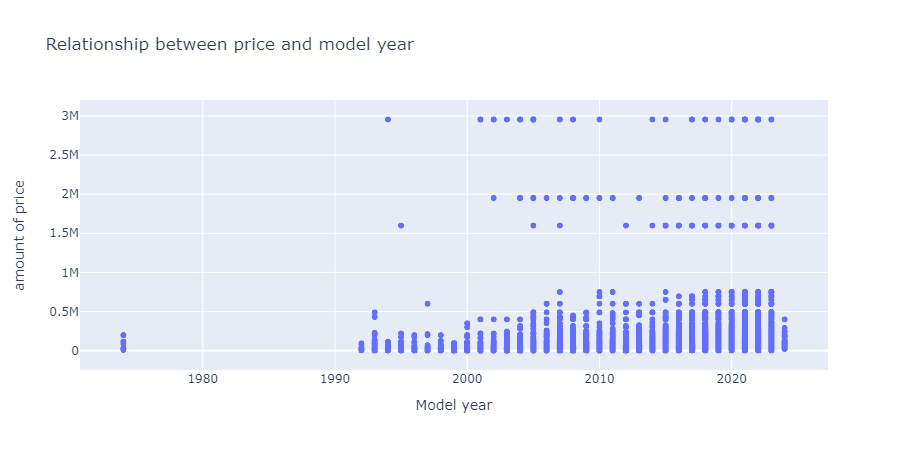

In [9]:
fig = px.scatter(train, x='model_year', y='price', 
                 labels={'model_year':'Model year', 'price':'amount of price'}, 
                 title='Relationship between price and model year')

fig.show()

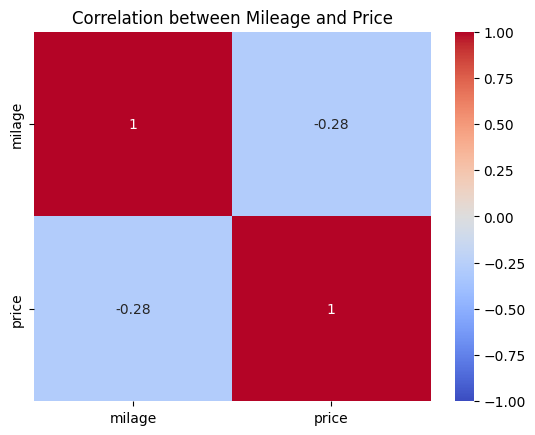

In [10]:
df_subset = train[['milage', 'price']]
correlation = df_subset.corr()
sns.heatmap(correlation, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation between Mileage and Price')
plt.show()

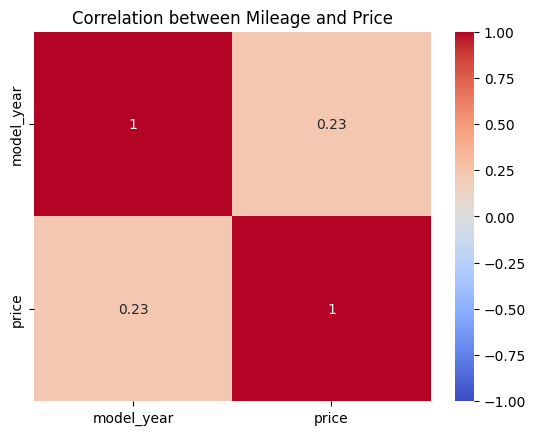

In [11]:
df_subset = train[['model_year', 'price']]
correlation = df_subset.corr()
sns.heatmap(correlation, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation between Mileage and Price')
plt.show()

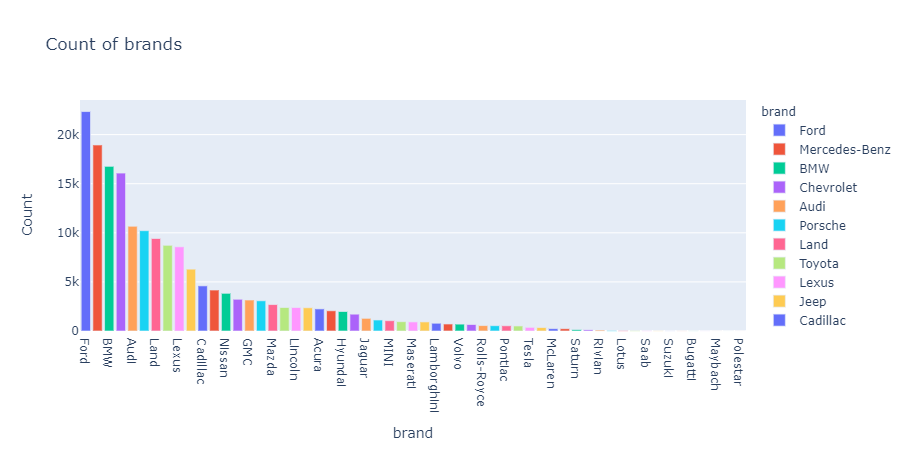

In [12]:
# Split the genres and count their occurrences
Brand_counts = train['brand'].explode().value_counts()

# Create a bar chart
fig = px.bar(Brand_counts, x=Brand_counts.index, y=Brand_counts.values,
             labels={'x':'Brand', 'y':'Count'},
             title='Count of brands',
             color=Brand_counts.index)

fig.show()

In [13]:
train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 181067 entries, 0 to 188532
Data columns (total 12 columns):
 #   Column        Non-Null Count   Dtype 
---  ------        --------------   ----- 
 0   id            181067 non-null  int64 
 1   brand         181067 non-null  object
 2   model         181067 non-null  object
 3   model_year    181067 non-null  int64 
 4   milage        181067 non-null  int64 
 5   fuel_type     181067 non-null  object
 6   engine        181067 non-null  object
 7   transmission  181067 non-null  object
 8   ext_col       181067 non-null  object
 9   int_col       181067 non-null  object
 10  accident      181067 non-null  object
 11  price         181067 non-null  int64 
dtypes: int64(4), object(8)
memory usage: 18.0+ MB


In [14]:
int_replacements = {
    'Medium Earth Gray': 'Gray',
    'Diesel Gray / Black': 'Gray',
    'Dark Ash': 'Gray',
    'Graphite': 'Gray',
    'Dark Galvanized': 'Charcoal',
    'Light Gray': 'Gray',
    'Ash': 'Gray',
    'Jet Black': 'Black',
    'Global Black': 'Black',
    'Black Onyx': 'Black',
    'Parchment.': 'Beige',
    'Sardar Brown': 'Brown',
    'Black/Gun Metal': 'Black',
    'Charcoal Black': 'Charcoal',
    'Ebony': 'Brown',
    'Ebony Black': 'Black',
    'Carbon Black': 'Black',
    'Obsidian Black': 'Black',
    'Black / Saddle Brown': 'Black',
    'Black/Saddle Brown': 'Black',
    'Black / Brown': 'Black',
    'Saddle Brown': 'Brown',
    'Sand Beige': 'Beige',
    'Camel': 'Beige',
    'Parchment': 'Beige',
    'Macchiato Beige/Black': 'Beige',
    'Silk Beige/Espresso Brown': 'Beige',
    'Canberra Beige': 'Beige',
    'Macchiato': 'Beige',
    'Almond Beige': 'Beige',
    'Grace White': 'White',
    'Ivory / Ebony': 'White',
    'Bianco Polar': 'White',
    'White / Brown': 'White',
    'Platinum': 'White',
    'Cloud': 'Blue',
    'Rift Metallic': 'White',
    'Light Platinum / Jet Black': 'Silver',
    'Billet Clearcoat Metallic': 'Silver',
    'Sakhir Orange': 'Orange',
    'Pimento Red w/Ebony': 'Red',
    'Adrenaline Red': 'Red',
    'Rioja Red': 'Red',
    'Classic Red': 'Red',
    'Magma Red': 'Red',
    'Cobalt Blue': 'Blue',
    'Tempest': 'Blue',
    'Stormy Sea': 'Blue',
    'Navy Pier': 'Blue',
    'Charles Blue': 'Blue',
    'Rhapsody Blue': 'Blue',
    'Kyalami Orange': 'Orange',
    'Sakhir Orange/Black': 'Orange',
    'Dark Gray': 'Gray',
    'Deep Garnet': 'Red',
    'Scarlet Ember': 'Red',
    'Beluga': 'Blue',
    'Chestnut': 'Brown',
    'Boulder': 'Gray',
    'Macchiato/Magmagrey': 'Beige',
    'Medium Stone': 'Gray',
    'BLACK': 'Black',
    'Portland': 'Gray',
    'Sandstone': 'Beige',
    'Slate': 'Gray',
    'Cappuccino': 'Brown',
    'Oyster W/Contrast': 'Beige',
    'Nero Ade': 'Black',
    'Light Titanium': 'Silver',
    'Tan': 'Beige',
    'Brandy': 'Brown',
    'Amber': 'Yellow',
    'Hotspur': 'Blue',
    'Chateau': 'Green',
    'Ice': 'Blue',
    'Blk': 'Black',
    'Mesa': 'Brown',
    'Espresso': 'Brown',
    'Ceramic': 'White',
    'Medium Dark Slate': 'Gray',
    'Graphite w/Gun Metal': 'Gray',
    'Cocoa / Dune': 'Brown',
    'Roast': 'Brown',
    'Hotspur Hide': 'Brown',
    'ORANGE': 'Orange',
    'Walnut': 'Brown',
    'Caramel': 'Beige',
    'Giallo Taurus / Nero Ade': 'Yellow',
    'Medium Pewter': 'Gray',
    'Camel Leather': 'Brown',
    'Anthracite': 'Gray',
    'Mocha': 'Brown',
    'Sahara Tan': 'Beige',
    'Porpoise': 'Beige',
    'Deep Cypress': 'Green',
    'Light Slate': 'Gray',
    'Beluga Hide': 'Black',
    'Tupelo': 'Green',
    'Gideon': 'Beige',
    'Medium Light Camel': 'Beige',
    'Nero': 'Black',
    'Deep Chestnut': 'Red',
    'Dark Auburn': 'Brown',
    'Shale': 'Gray',
    'BEIGE': 'Beige',
    'Linen': 'Beige',
    'WHITE': 'White'
}
ext_replacements = {
    'Blu': 'Blue',
    'BLUE': 'Blue',
    'Glacier': 'Blue',
    'BLU ELEOS': 'Blue',
    'Dark Sapphire': 'Navy',
    'Tangerine': 'Orange',
    'Pumpkin': 'Orange',
    'Clementine': 'Orange',
    'Granite': 'Gray',
    'Go Mango!': 'Yellow',
    'Onyx': 'Black',
    'Gecko Pearlcoat': 'Green',
    'Obsidian': 'Black',
    'Metallic': 'Silver',
    'Grigio Nimbus': 'Silver',
    'Chalk': 'White',
    'Bianco Monocerus': 'White',
    'Verde': 'Green',
    'Dark Graphite Metallic': 'Gray',
    'BLACK': 'Black',
    'Dark Moss': 'Green',
    'Granite Crystal Clearcoat Metallic': 'Gray',
    'Ebony Twilight Metallic': 'Black',
    'Satin Steel Metallic': 'Silver',
    'Magnetic Metallic': 'Gray',
    'Dark Matter Metallic': 'Gray',
    'Dark Ash Metallic': 'Gray',
    'Iridium Metallic': 'Gray',
    'Nightfall Mica': 'Navy',
    'Sandstone Metallic': 'Beige',
    'Rift Metallic': 'White',
    'Billet Clearcoat Metallic': 'Silver',
    'Tan': 'Beige',
    'Ice': 'Blue',
    'Hellayella': 'Yellow',
    'Granite': 'Gray',
    'Yulong': 'White',
    'Blueprint': 'Navy',
    'Arancio Borealis': 'Orange',
    'Hellayella Clearcoat': 'Yellow',
    'Moonlight Cloud': 'Navy',
    'Liquid Platinum': 'Silver',
    'Gun Metallic': 'Gray',
    'Manhattan Noir Metallic': 'Gray',
    'Lavender': 'Purple',
    'Violet': 'Purple',
    'Pink': 'Purple',
    'Mauve': 'Plum',
    'Tempest': 'Blue',
    'Nero Daytona': 'Black',
    'Scarlet Ember': 'Red',
    'Infrared Tintcoat': 'Red',
    'Maximum Steel Metallic': 'Gray',
    'Ember Pearlcoat': 'Brown',
    'Rich Garnet Metallic': 'Brown',
    'Tungsten Metallic': 'Gray',
    'Nero Noctis': 'Black',
    'Platinum Quartz Metallic': 'White',
    'Ruby Flare Pearl': 'Red',
    'Bianco Icarus Metallic': 'White',
    'Stormy Sea': 'Blue',
    'Mountain Air Metallic': 'Blue',
    'Wind Chill Pearl': 'White',
    'Iridescent Pearl Tricoat': 'White',
    'Black Cherry': 'Plum',
    'Black Forest Green': 'Green',
    'Maroon': 'Red',
    'Rosso': 'Red',
    'Rosso Corsa': 'Red',
    'Rosso Mars Metallic': 'Red',
    'Quicksilver Metallic': 'Silver',
    'Designo Magno Matte': 'Gray',
    'Granite Crystal Metallic Clearcoat': 'Gray',
    'Bianco Isis': 'White',
    'Sunset Drift Chromaflair': 'Orange',
    'Ametrin Metallic': 'Plum',
    'GT SILVER': 'Silver',
    'Caviar': 'Black'
}

In [15]:
def standardize_and_extract_colors(train, int_replacements, ext_replacements):
    # Step 1: Apply specific color replacements to standardize color names
    train['int_col'] = train['int_col'].replace(int_replacements)
    train['ext_col'] = train['ext_col'].replace(ext_replacements)
    
    # Ensure both columns are lowercase after replacements
    train['int_col'] = train['int_col'].str.lower()
    train['ext_col'] = train['ext_col'].str.lower()

    # Define a list of common base colors
    base_colors = [
    'black', 'white', 'gray', 'silver', 'brown', 'red', 'blue', 'green',
    'beige', 'tan', 'orange', 'yellow', 'purple', 'plum', 'charcoal', 
    'ivory', 'camel', 'chestnut', 'pearl', 'linen', 'graphite', 'copper', 
    'slate', 'bronze', 'sand', 'amber', 'macchiato', 'ebony', 'cocoa', 'navy'
    ]

    
    # Function to find base color
    def find_base_color(text):
        for color in base_colors:
            if color in text:
                return color
        return text
    
    # Step 2: Apply base color extraction after standardization
    train['int_col'] = train['int_col'].apply(find_base_color)
    train['ext_col'] = train['ext_col'].apply(find_base_color)

    return train

In [16]:
colors = standardize_and_extract_colors(train, int_replacements, ext_replacements)

In [17]:
train_new = colors

In [18]:
train_new.head()

,id,brand,model,model_year,milage,fuel_type,engine,transmission,ext_col,int_col,accident,price
0,0,MINI,Cooper S Base,2007,213000,Gasoline,172.0HP 1.6L 4 Cylinder Engine Gasoline Fuel,A/T,yellow,gray,None reported,4200
1,1,Lincoln,LS V8,2002,143250,Gasoline,252.0HP 3.9L 8 Cylinder Engine Gasoline Fuel,A/T,silver,beige,At least 1 accident or damage reported,4999
2,2,Chevrolet,Silverado 2500 LT,2002,136731,E85 Flex Fuel,320.0HP 5.3L 8 Cylinder Engine Flex Fuel Capab...,A/T,blue,gray,None reported,13900
3,3,Genesis,G90 5.0 Ultimate,2017,19500,Gasoline,420.0HP 5.0L 8 Cylinder Engine Gasoline Fuel,Transmission w/Dual Shift Mode,black,black,None reported,45000
4,4,Mercedes-Benz,Metris Base,2021,7388,Gasoline,208.0HP 2.0L 4 Cylinder Engine Gasoline Fuel,7-Speed A/T,black,beige,None reported,97500


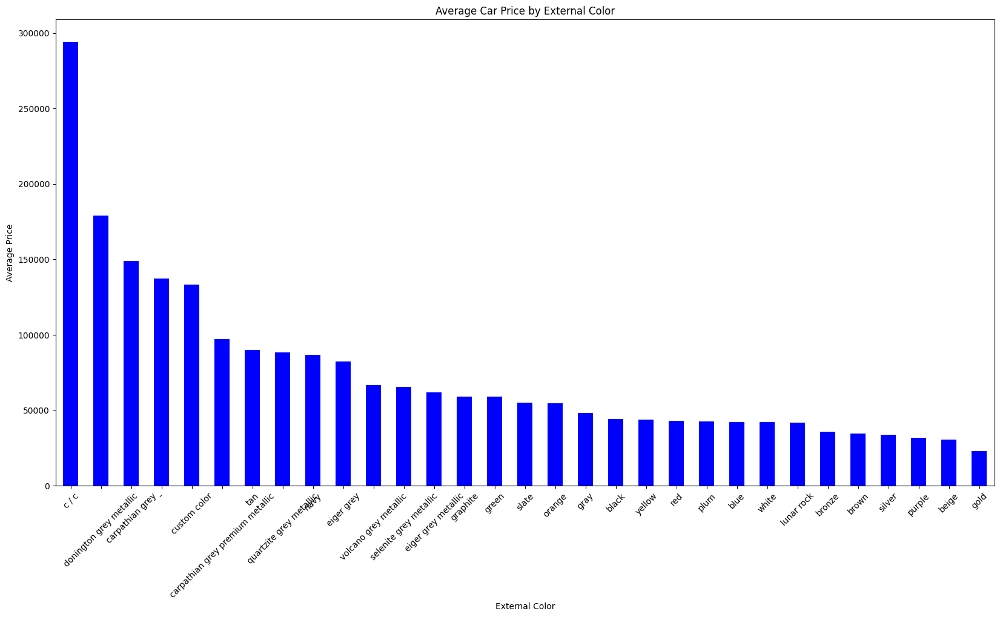

In [19]:
color_price = train_new.groupby('ext_col')['price'].agg(['count' , 'mean']).sort_values(by = 'mean' , ascending = False)
# Plot external color vs average price
plt.figure(figsize=(20,10))
color_price['mean'].plot(kind='bar', color='blue')
plt.title('Average Car Price by External Color')
plt.ylabel('Average Price')
plt.xlabel('External Color')
plt.xticks(rotation=45)
plt.show()


In [20]:
# Calculate model year quartiles
model_year_quartiles = train_new['model_year'].quantile([0.25, 0.5, 0.75])

# Function to categorize model year
def categorize_model_year(year):
    if year <= model_year_quartiles[0.25]:
        return 'vintage'
    elif year <= model_year_quartiles[0.5]:
        return 'very old'
    elif year <= model_year_quartiles[0.75]:
        return 'old'
    else:
        return 'almost new'

train['model_year'] = train['model_year'].apply(categorize_model_year)

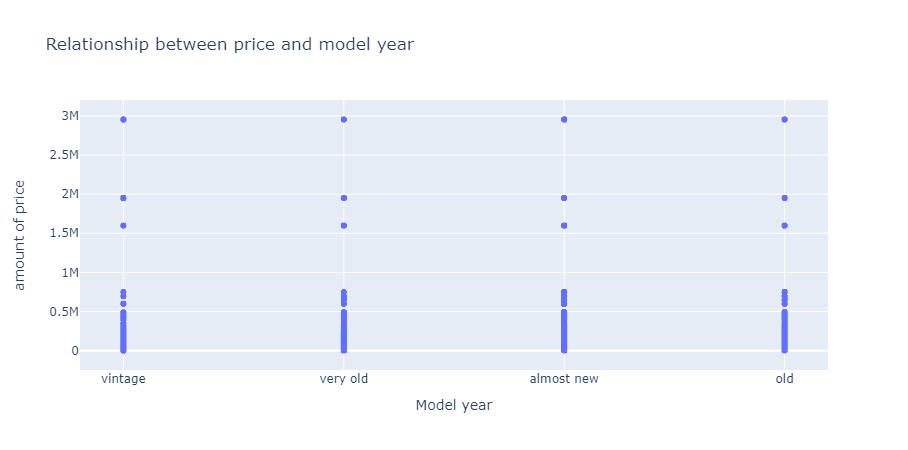

In [21]:
fig = px.scatter(train, x='model_year', y='price', 
                 labels={'model_year':'Model year', 'price':'amount of price'}, 
                 title='Relationship between price and model year')

fig.show()

In [22]:
# List of all categorical features to encode
features = ['brand', 'model','model_year','milage', 'engine', 'ext_col', 'int_col', 'fuel_type', 'accident','price']

In [23]:
train_new = train_new[features]



In [24]:
train_new.head()

,brand,model,model_year,milage,engine,ext_col,int_col,fuel_type,accident,price
0,MINI,Cooper S Base,vintage,213000,172.0HP 1.6L 4 Cylinder Engine Gasoline Fuel,yellow,gray,Gasoline,None reported,4200
1,Lincoln,LS V8,vintage,143250,252.0HP 3.9L 8 Cylinder Engine Gasoline Fuel,silver,beige,Gasoline,At least 1 accident or damage reported,4999
2,Chevrolet,Silverado 2500 LT,vintage,136731,320.0HP 5.3L 8 Cylinder Engine Flex Fuel Capab...,blue,gray,E85 Flex Fuel,None reported,13900
3,Genesis,G90 5.0 Ultimate,very old,19500,420.0HP 5.0L 8 Cylinder Engine Gasoline Fuel,black,black,Gasoline,None reported,45000
4,Mercedes-Benz,Metris Base,almost new,7388,208.0HP 2.0L 4 Cylinder Engine Gasoline Fuel,black,beige,Gasoline,None reported,97500


In [25]:
train_new['accident'] = train_new['accident'].replace(
    {'At least 1 accident or damage reported': 1, 'None reported': 0})

/tmp/ipykernel_2932/1100790135.py:1: FutureWarning:

Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`



In [26]:
train_new.head()

,brand,model,model_year,milage,engine,ext_col,int_col,fuel_type,accident,price
0,MINI,Cooper S Base,vintage,213000,172.0HP 1.6L 4 Cylinder Engine Gasoline Fuel,yellow,gray,Gasoline,0,4200
1,Lincoln,LS V8,vintage,143250,252.0HP 3.9L 8 Cylinder Engine Gasoline Fuel,silver,beige,Gasoline,1,4999
2,Chevrolet,Silverado 2500 LT,vintage,136731,320.0HP 5.3L 8 Cylinder Engine Flex Fuel Capab...,blue,gray,E85 Flex Fuel,0,13900
3,Genesis,G90 5.0 Ultimate,very old,19500,420.0HP 5.0L 8 Cylinder Engine Gasoline Fuel,black,black,Gasoline,0,45000
4,Mercedes-Benz,Metris Base,almost new,7388,208.0HP 2.0L 4 Cylinder Engine Gasoline Fuel,black,beige,Gasoline,0,97500


In [27]:
print(train_new['int_col'].nunique())
print(train_new['ext_col'].nunique())

20
31


In [28]:
from sklearn.preprocessing import LabelEncoder
# Create separate LabelEncoders for each column
label_encoder_int_col = LabelEncoder()
label_encoder_ext_col = LabelEncoder()
label_encoder_model_year = LabelEncoder()
label_encoder_fuel_type = LabelEncoder()

# Fit and transform the train set using separate encoders
train_new['int_col'] = label_encoder_int_col.fit_transform(train_new['int_col'])
train_new['ext_col'] = label_encoder_ext_col.fit_transform(train_new['ext_col'])
train_new['model_year'] = label_encoder_model_year.fit_transform(train_new['model_year'])
train_new['fuel_type'] = label_encoder_fuel_type.fit_transform(train_new['fuel_type'])

In [29]:
train_new.head()

,brand,model,model_year,milage,engine,ext_col,int_col,fuel_type,accident,price
0,MINI,Cooper S Base,3,213000,172.0HP 1.6L 4 Cylinder Engine Gasoline Fuel,29,7,2,0,4200
1,Lincoln,LS V8,3,143250,252.0HP 3.9L 8 Cylinder Engine Gasoline Fuel,24,0,2,1,4999
2,Chevrolet,Silverado 2500 LT,3,136731,320.0HP 5.3L 8 Cylinder Engine Flex Fuel Capab...,2,7,1,0,13900
3,Genesis,G90 5.0 Ultimate,2,19500,420.0HP 5.0L 8 Cylinder Engine Gasoline Fuel,1,1,2,0,45000
4,Mercedes-Benz,Metris Base,0,7388,208.0HP 2.0L 4 Cylinder Engine Gasoline Fuel,1,0,2,0,97500


In [30]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
train_new['price'] = scaler.fit_transform(train_new[['price']])
def calculate_regularized_smoothed_means(train_data, target_column, categorical_column, smoothing_factor=10):

    global_mean = train_data[target_column].mean()

    # Group and calculate sum and count for the categorical column
    category_stats = train_data.groupby(categorical_column)[target_column].agg(['count', 'sum'])
    
    # Calculate regular mean
    category_stats['mean'] = category_stats['sum'] / category_stats['count']
    
    # Calculate smoothed mean
    category_stats['smoothed_mean'] = (category_stats['sum'] + global_mean * smoothing_factor) / \
                                      (category_stats['count'] + smoothing_factor)

    # Save the smoothed mean to a dictionary for later use on the test set
    smoothed_means_dict = category_stats['smoothed_mean'].to_dict()

    # Apply the smoothed means to the training set
    train_data[categorical_column] = train_data[categorical_column].map(smoothed_means_dict)
    
    return train_data, smoothed_means_dict ,scaler


In [31]:
train_new ,smoothed_means_dict_brand , scaler  = calculate_regularized_smoothed_means(train_new, 'price' , 'brand')
train_new , smoothed_means_dict_model ,scaler  = calculate_regularized_smoothed_means(train_new, 'price' , 'model')
train_new , smoothed_means_dict_engine , scaler  =  calculate_regularized_smoothed_means(train_new, 'price' , 'engine')

In [32]:
train_new['milage'] = np.log10(train[ 'milage'])

In [33]:
train_new.head()

,brand,model,model_year,milage,engine,ext_col,int_col,fuel_type,accident,price
0,0.005164,0.003851,3,5.328380,0.003497,29,7,2,0,0.000745
1,0.009700,0.006270,3,5.156095,0.004633,24,0,2,1,0.001016
2,0.013443,0.008337,3,5.135867,0.005662,2,7,1,0,0.004031
3,0.017256,0.015363,2,4.290035,0.013501,1,1,2,0,0.014566
4,0.016619,0.021000,0,3.868527,0.011950,1,0,2,0,0.032350


In [34]:
X = train_new.drop('price' , axis = 1 )
y = train_new['price']

In [35]:
from sklearn.model_selection import train_test_split

# Split data into training and test sets
# You can adjust the test_size (e.g., 0.2 for 20% test data)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [36]:
X_train.isnull().sum()

brand         0
model         0
model_year    0
milage        0
engine        0
ext_col       0
int_col       0
fuel_type     0
accident      0
dtype: int64

In [42]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error

In [41]:
model = RandomForestRegressor(n_estimators=100, random_state=42)

# Train the model
model.fit(X_train, y_train)

# Make predictions
y_pred = model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
print(f'Mean Squared Error: {mse}')


Mean Squared Error: 0.0005898695544491171


In [43]:
test.head()

,id,brand,model,model_year,milage,fuel_type,engine,transmission,ext_col,int_col,accident,clean_title
0,188533,Land,Rover LR2 Base,2015,98000,Gasoline,240.0HP 2.0L 4 Cylinder Engine Gasoline Fuel,6-Speed A/T,White,Beige,None reported,Yes
1,188534,Land,Rover Defender SE,2020,9142,Hybrid,395.0HP 3.0L Straight 6 Cylinder Engine Gasoli...,8-Speed A/T,Silver,Black,None reported,Yes
2,188535,Ford,Expedition Limited,2022,28121,Gasoline,3.5L V6 24V PDI DOHC Twin Turbo,10-Speed Automatic,White,Ebony,None reported,NaN
3,188536,Audi,A6 2.0T Sport,2016,61258,Gasoline,2.0 Liter TFSI,Automatic,Silician Yellow,Black,None reported,NaN
4,188537,Audi,A6 2.0T Premium Plus,2018,59000,Gasoline,252.0HP 2.0L 4 Cylinder Engine Gasoline Fuel,A/T,Gray,Black,None reported,Yes


In [44]:
test['accident'].unique()

array(['None reported', 'At least 1 accident or damage reported', nan],
      dtype=object)

In [45]:
test.drop('transmission', axis = 1 , inplace = True)
test.drop('clean_title' , axis = 1 ,inplace = True)

In [48]:
colors = standardize_and_extract_colors(test, int_replacements, ext_replacements)

In [49]:
test_new = colors

In [50]:
# Calculate model year quartiles
model_year_quartiles = test_new['model_year'].quantile([0.25, 0.5, 0.75])

# Function to categorize model year
def categorize_model_year(year):
    if year <= model_year_quartiles[0.25]:
        return 'vintage'
    elif year <= model_year_quartiles[0.5]:
        return 'very old'
    elif year <= model_year_quartiles[0.75]:
        return 'old'
    else:
        return 'almost new'

test_new['model_year'] = test_new['model_year'].apply(categorize_model_year)

In [51]:
test_new.head()

,id,brand,model,model_year,milage,fuel_type,engine,ext_col,int_col,accident
0,188533,Land,Rover LR2 Base,very old,98000,Gasoline,240.0HP 2.0L 4 Cylinder Engine Gasoline Fuel,white,beige,None reported
1,188534,Land,Rover Defender SE,old,9142,Hybrid,395.0HP 3.0L Straight 6 Cylinder Engine Gasoli...,silver,black,None reported
2,188535,Ford,Expedition Limited,almost new,28121,Gasoline,3.5L V6 24V PDI DOHC Twin Turbo,white,brown,None reported
3,188536,Audi,A6 2.0T Sport,very old,61258,Gasoline,2.0 Liter TFSI,yellow,black,None reported
4,188537,Audi,A6 2.0T Premium Plus,old,59000,Gasoline,252.0HP 2.0L 4 Cylinder Engine Gasoline Fuel,gray,black,None reported


In [52]:
test_new['accident'] = test_new['accident'].replace(
    {'At least 1 accident or damage reported': 1, 'None reported': 0})

/tmp/ipykernel_2932/589503096.py:1: FutureWarning:

Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`



In [53]:
def handle_unseen_labels(col, encoder):
    # Map known classes to their transformed values
    class_map = {label: idx for idx, label in enumerate(encoder.classes_)}
    
    # Apply the mapping, and handle unseen labels by assigning np.nan
    return col.apply(lambda x: class_map.get(x, np.nan))

# Apply the function to the test set using the corresponding encoder
test_new['int_col'] = handle_unseen_labels(test_new['int_col'], label_encoder_int_col)
test_new['ext_col'] = handle_unseen_labels(test_new['ext_col'], label_encoder_ext_col)
test_new['model_year'] = handle_unseen_labels(test_new['model_year'], label_encoder_model_year)
test_new['fuel_type'] = handle_unseen_labels(test_new['fuel_type'], label_encoder_fuel_type)

In [54]:
def apply_smoothed_means_to_test(test_data, categorical_column, smoothed_means_dict):
    # Apply the smoothed mean from the training set to the test set
    test_data[categorical_column] = test_data[categorical_column].map(smoothed_means_dict)
    
    # Handle unseen categories that may not be in the smoothed_means_dict (optional)
    test_data[categorical_column].fillna(test_data[categorical_column].mean(), inplace=True)

    return test_data

In [55]:
test_new = apply_smoothed_means_to_test(test_new, categorical_column='model', smoothed_means_dict=smoothed_means_dict_model)
test_new = apply_smoothed_means_to_test(test_new, categorical_column='brand', smoothed_means_dict=smoothed_means_dict_brand)
test_new = apply_smoothed_means_to_test(test_new, categorical_column='engine', smoothed_means_dict=smoothed_means_dict_engine)

/tmp/ipykernel_2932/3567687121.py:6: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



/tmp/ipykernel_2932/3567687121.py:6: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or

In [56]:
test_new['milage'] = np.log10(test_new[ 'milage'])

In [57]:
test_new.head(20)

,id,brand,model,model_year,milage,fuel_type,engine,ext_col,int_col,accident
0,188533,0.017318,0.007293,2,4.991226,2.0,0.006181,28,0,0.0
1,188534,0.017318,0.023450,1,3.961041,3.0,0.025372,24,1,0.0
2,188535,0.012867,0.016431,0,4.449031,2.0,0.018429,28,3,0.0
3,188536,0.013168,0.009294,2,4.787163,2.0,0.015474,29,1,0.0
4,188537,0.013168,0.007966,1,4.770852,2.0,0.009698,14,1,0.0
5,188538,0.013443,0.007360,3,4.997928,2.0,0.006599,1,1,0.0
6,188539,0.011087,0.006843,3,5.287802,2.0,0.005390,24,7,0.0
7,188540,0.013443,0.008436,1,4.604312,2.0,0.018683,24,1,0.0
8,188541,0.016619,0.015452,2,3.880814,2.0,0.014407,1,1,0.0
9,188542,0.017256,0.011512,2,4.801404,2.0,0.012996,1,1,0.0


In [58]:
test.shape

(125690, 10)

In [60]:
for column in test_new.columns:
    mode_value = test_new[column].mode()[0]  # Get the mode of the column
    test_new[column].fillna(mode_value, inplace=True)

print(test_new.isnull().sum())

id            0
brand         0
model         0
model_year    0
milage        0
fuel_type     0
engine        0
ext_col       0
int_col       0
accident      0
dtype: int64


/tmp/ipykernel_2932/1042058210.py:3: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



/tmp/ipykernel_2932/1042058210.py:3: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or

In [61]:
X = test_new[['brand', 'model','model_year','milage', 'engine', 'ext_col', 'int_col', 'fuel_type', 'accident']]

In [62]:
X.shape

(125690, 9)

In [63]:
predictions = model.predict(X)

In [64]:
predictions.shape

(125690,)

In [65]:
original_predictions = scaler.inverse_transform(predictions.reshape(-1, 1))  # Reshape if necessary

In [67]:
predictions_df = pd.DataFrame({
    'id': test_new['id'],  # Ensure `test_new` has an 'id' column
    'price': original_predictions.flatten()  # Flatten the predictions if needed
})

# Save the DataFrame to a CSV file
predictions_df.to_csv('submission.csv', index=False)

print("CSV file 'predictions.csv' created successfully.")

CSV file 'predictions.csv' created successfully.
